# Online DA: Imperfect pseudo experiments validation: 
Katie Brennan  
January 27, 2022  

In [1]:
import sys
import numpy as np
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib.path as mpath
import cartopy.crs as ccrs

import pickle 

In [2]:
sys.path.append("../../")
import Online_DA_utils as oda

In [3]:
sys.path.append("/home/disk/p/mkb22/Documents/si_analysis_kb/LIMs/SI_LIMs/")

import LIM_utils_kb as limkb
import LIM_stats_kb as statskb
# import LIM_plot_kb as plotkb
import LIM_building as limbuild

In [4]:
import importlib
importlib.reload(oda)

<module 'Online_DA_utils' from '../../Online_DA_utils.py'>

In [5]:
plt.rcParams['figure.dpi']=300

In [6]:
limvars = ['tas','tos','psl','zg','sit','sic']

In [7]:
import datetime

nyears = 155
startyr = 1851

# Generate times: 
t_total = nyears*12
years = int(1851+np.floor((t_total-1)/12))
time = np.array([datetime.datetime(y, m, 15) for y in np.arange(startyr,startyr+nyears,1) for m in np.arange(1,13,1)])

In [8]:
niters = 1
it_list = np.arange(1,niters+1,1)

In [9]:
time

array([datetime.datetime(1851, 1, 15, 0, 0),
       datetime.datetime(1851, 2, 15, 0, 0),
       datetime.datetime(1851, 3, 15, 0, 0), ...,
       datetime.datetime(2005, 10, 15, 0, 0),
       datetime.datetime(2005, 11, 15, 0, 0),
       datetime.datetime(2005, 12, 15, 0, 0)], dtype=object)

## Load experiment: 

In [10]:
LIM = oda.load_L('cesm_lme_Amon')
LIMd = LIM['LIMd']
LIMd.keys()

Loading: /home/disk/kalman2/mkb22/SI_LIMs/sensitivity_testing/master/LIMcast_cesm_lme_Amon_ntrain_850_1650_cesm_lme_Amon_validy_1651_1850_tas50L0.1_psl50L0.1_zg50L0.1_tos50L0.1_sit50L40_sic50L40_20211202_sqrtWt.pkl


dict_keys(['vec', 'veci', 'val', 'lam_L', 'C_0', 'C_1', 'Gt', 'lam_L_adj', 'npos_eigenvalues', 'E3', 'W_all', 'standard_factor', 'E3_all', 'E_sic', 'var_dict', 'P_train', 'exp_setup', 'frac_neg_eigenvals'])

In [31]:
output_dir = '/home/disk/kalman2/mkb22/Online_DA/experiments/pseudo/nobs50/'
#Xa_dcomp = np.zeros((niters,LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data['Xa'].shape[0]))
nmodes = LIMd['E3_all'].shape[1]

filename0_4 = ('ODA_imperfect_pseudo_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon'+
                  '_hadCRUT_locations_rand100_noise2_t_0_1860_nomj_trainR0_4_it1.pkl')
filename0_1 = ('ODA_imperfect_pseudo_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon'+
                  '_hadCRUT_locations_rand100_noise2_t_0_1860_nomj_trainR0_2_it1.pkl')
filename0_01 = ('ODA_imperfect_pseudo_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon'+
                  '_hadCRUT_locations_rand100_noise2_t_0_1860_nomj_trainR0_01_it1.pkl')
filename0_6 = ('ODA_imperfect_pseudo_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon'+
                    '_hadCRUT_locations_rand100_noise2_t_0_1860_nomj_trainR0_6_it1.pkl')
filename1 = ('ODA_imperfect_pseudo_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon'+
                    '_hadCRUT_locations_rand100_noise2_t_0_1860_nomj_trainR1_it2.pkl')
filename2 = ('ODA_imperfect_pseudo_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon'+
                    '_hadCRUT_locations_rand100_noise2_t_0_1860_nomj_trainR2_it1.pkl')
filename10 = ('ODA_imperfect_pseudo_prior_cesm_lme_Amon_LIM_cesm_lme_Amon_obs_cmip6_mpi_hist_regridlme_Amon'+
                    '_hadCRUT_locations_rand100_noise2_t_0_1860_nomj_trainR10_it1.pkl')


data_all0_4 = pickle.load(open(output_dir+filename0_4,"rb"))
data_all0_1 = pickle.load(open(output_dir+filename0_1,"rb"))
data_all0_01 = pickle.load(open(output_dir+filename0_01,"rb"))
data_all1 = pickle.load(open(output_dir+filename1,"rb"))
data_all0_6 = pickle.load(open(output_dir+filename0_6,"rb"))
data_all2 = pickle.load(open(output_dir+filename2,"rb"))
data_all10 = pickle.load(open(output_dir+filename10,"rb"))


Xa_dcomp0_4 = np.zeros((LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all0_4['Xa'].shape[0]))
Xa_dcomp0_4 = limkb.decompress_eof_separate_sic(data_all0_4['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                                 LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                                 LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                                 sic_separate=LIMd['exp_setup']['sic_separate'])

Xa_dcomp0_1 = np.zeros((LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all0_1['Xa'].shape[0]))
Xa_dcomp0_1 = limkb.decompress_eof_separate_sic(data_all0_1['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                                LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                                LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                                sic_separate=LIMd['exp_setup']['sic_separate'])

Xa_dcomp1 = np.zeros((LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all1['Xa'].shape[0]))
Xa_dcomp1 = limkb.decompress_eof_separate_sic(data_all1['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                              LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                              LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                              sic_separate=LIMd['exp_setup']['sic_separate'])
Xa_dcomp2 = np.zeros((LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all2['Xa'].shape[0]))
Xa_dcomp2 = limkb.decompress_eof_separate_sic(data_all2['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                              LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                              LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                              sic_separate=LIMd['exp_setup']['sic_separate'])

Xa_dcomp0_6 = np.zeros((LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all0_6['Xa'].shape[0]))
Xa_dcomp0_6 = limkb.decompress_eof_separate_sic(data_all0_6['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                                 LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                                 LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                                 sic_separate=LIMd['exp_setup']['sic_separate'])

Xa_dcomp0_01 = np.zeros((LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all0_01['Xa'].shape[0]))
Xa_dcomp0_01 = limkb.decompress_eof_separate_sic(data_all0_01['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                                 LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                                 LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                                 sic_separate=LIMd['exp_setup']['sic_separate'])

Xa_dcomp10 = np.zeros((LIMd['E3_all'].shape[0]+LIMd['E_sic'].shape[0],data_all10['Xa'].shape[0]))
Xa_dcomp10 = limkb.decompress_eof_separate_sic(data_all10['Xa'].T,nmodes,LIMd['exp_setup']['nmodes_sic'],
                                                 LIMd['E3_all'],LIMd['E_sic'],LIMd['exp_setup']['limvars'],
                                                 LIMd['var_dict'],LIMd['W_all'],Weights=LIMd['exp_setup']['Weight'],
                                                 sic_separate=LIMd['exp_setup']['sic_separate'])

In [32]:
Xa_dcomp_all0_4 = {}
Xa_dcomp_all0_1 = {}
Xa_dcomp_all0_01 = {}
Xa_dcomp_all0_6 = {}
Xa_dcomp_all1 = {}
Xa_dcomp_all2 = {}
Xa_dcomp_all10 = {}

for var in limvars: 
    Xa_dcomp_var0_4 = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all0_4['Xa'].shape[0]))
    Xa_dcomp_var0_6 = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all0_6['Xa'].shape[0]))
    Xa_dcomp_var1 = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all1['Xa'].shape[0]))
    Xa_dcomp_var2 = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all2['Xa'].shape[0]))
    Xa_dcomp_var10 = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all10['Xa'].shape[0]))
    Xa_dcomp_var0_1 = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all0_1['Xa'].shape[0]))
    Xa_dcomp_var0_01 = np.zeros((niters, LIMd['var_dict'][var]['var_ndof'],data_all0_01['Xa'].shape[0]))

    for i,it in enumerate(it_list):
        Xa_dcomp_var0_1[i,:,:] = Xa_dcomp0_1[LIMd['var_dict'][var]['var_inds'],:]
        Xa_dcomp_var0_4[i,:,:] = Xa_dcomp0_4[LIMd['var_dict'][var]['var_inds'],:]
        Xa_dcomp_var0_01[i,:,:] = Xa_dcomp0_01[LIMd['var_dict'][var]['var_inds'],:]
        Xa_dcomp_var0_6[i,:,:] = Xa_dcomp0_6[LIMd['var_dict'][var]['var_inds'],:]
        Xa_dcomp_var1[i,:,:] = Xa_dcomp1[LIMd['var_dict'][var]['var_inds'],:]
        Xa_dcomp_var2[i,:,:] = Xa_dcomp2[LIMd['var_dict'][var]['var_inds'],:]
        Xa_dcomp_var10[i,:,:] = Xa_dcomp10[LIMd['var_dict'][var]['var_inds'],:]

    Xa_dcomp_all0_1[var] = Xa_dcomp_var0_1
    Xa_dcomp_all0_01[var] = Xa_dcomp_var0_01
    Xa_dcomp_all0_4[var] = Xa_dcomp_var0_4
    Xa_dcomp_all0_6[var] = Xa_dcomp_var0_6
    Xa_dcomp_all1[var] = Xa_dcomp_var1
    Xa_dcomp_all2[var] = Xa_dcomp_var2
    Xa_dcomp_all10[var] = Xa_dcomp_var10

Text(0, 0.5, '$cov(d,d)/[HP_bH^{T}+R]$')

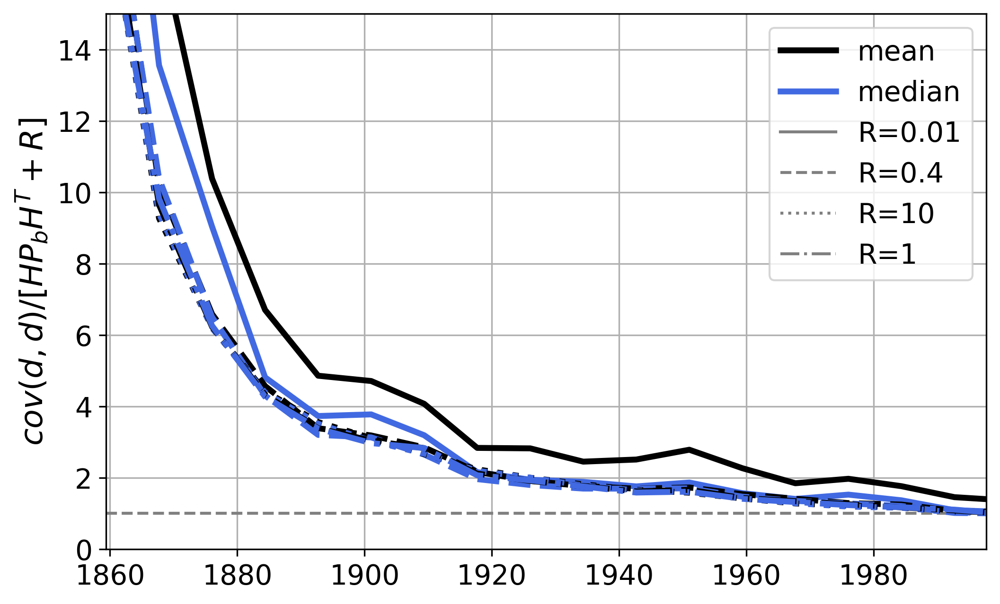

In [33]:
fig, ax = plt.subplots(figsize=(8, 5))
plt.axhline(1,color='gray',linestyle='--')

plt.plot(time[100::100],data_all0_01['ratio_mean_100'], color='k', linewidth=3, label='mean')
plt.plot(time[100::100],data_all0_01['ratio_median_100'],color='royalblue', linewidth=3, label='median')
plt.plot(time[100::100],data_all0_4['ratio_mean_100'], color='k', linewidth=3, linestyle='--')
plt.plot(time[100::100],data_all0_4['ratio_median_100'],color='royalblue', linewidth=3, linestyle='--')
plt.plot(time[100::100],data_all10['ratio_mean_100'], color='k', linewidth=3, linestyle='dotted')
plt.plot(time[100::100],data_all10['ratio_median_100'],color='royalblue', linewidth=3, linestyle='dotted')
plt.plot(time[100::100],data_all1['ratio_mean_100'], color='k', linewidth=3, linestyle='dashdot')
plt.plot(time[100::100],data_all1['ratio_median_100'],color='royalblue', linewidth=3, linestyle='dashdot')

plt.plot(np.arange(-10,-5),np.arange(5,10),color='gray',label= 'R=0.01')
plt.plot(np.arange(-10,-5),np.arange(5,10),color='gray',label= 'R=0.4', linestyle='--')
plt.plot(np.arange(-10,-5),np.arange(5,10),color='gray',label= 'R=10', linestyle='dotted')
plt.plot(np.arange(-10,-5),np.arange(5,10),color='gray',label= 'R=1', linestyle='dashdot')

plt.grid()
plt.ylim(0,15)
plt.xlim(time[100],time[-100])
plt.legend(fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('$cov(d,d)/[HP_bH^{T}+R]$', fontsize=16)

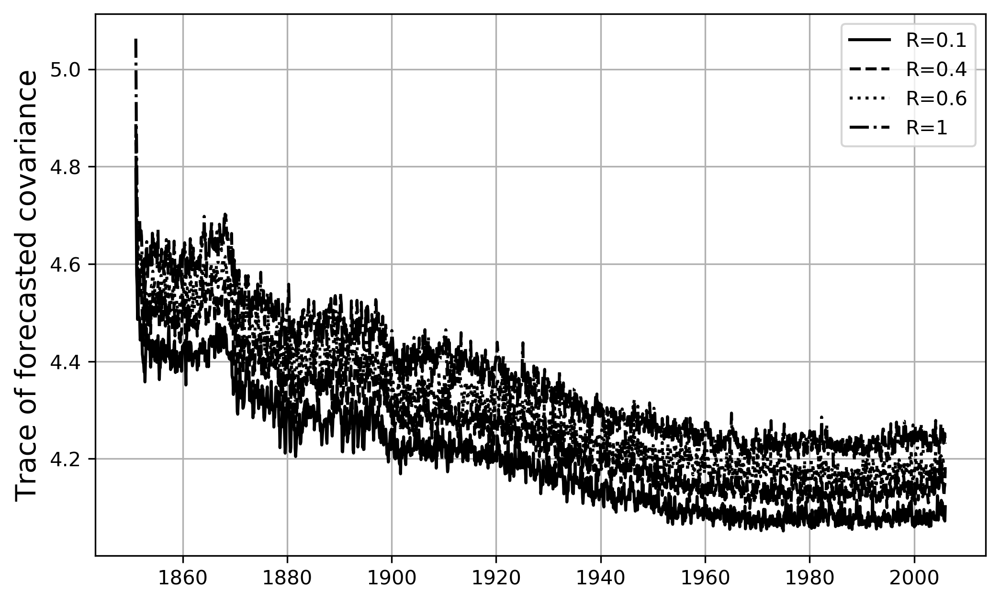

In [34]:
fig, ax = plt.subplots(figsize=(8, 5))

plt.plot(time, data_all0_1['Pb_trace'], color='k', label='R=0.1')
plt.plot(time, data_all0_4['Pb_trace'], color='k', linestyle='--',label='R=0.4')
plt.plot(time, data_all0_6['Pb_trace'], color='k', label='R=0.6',linestyle='dotted')
plt.plot(time, data_all1['Pb_trace'], color='k', linestyle='dashdot',label='R=1')
plt.legend()

plt.ylabel('Trace of forecasted covariance', fontsize=14)
plt.title('', fontsize=16)
plt.grid()

## Load Truth: 

In [35]:
mo='all'
#mo=7

# forecast lead time in months that defines the LIM training
tau = 1

#lat_cutoff = 0.1
lat_cutoff_dict = {'tas':0.1,'psl':0.1,'zg':0.1,'tos':0.1,'sit':40,'sic':40}

ntrain = 800
nvalid = 155

# tscut = False     # time start cut 
# tecut = 355       # 800 training years LME
# tecut = 0
# tscut = 800
tecut = 156
tscut = 1

# variables to include in the LIM (note "vars" is a Python command)
#limvars = ['tas','rlut','zg']
#limvars = ['tas','tos','psl','sit','sic']
#limvars = ['tas']
limvars = ['tas','tos','psl','zg','sit','sic']

limvars_nosic = []
nvars = len(limvars)

train_dsource = 'cesm_lme_Amon'
valid_dsource = 'cmip6_mpi_hist_regridlme_Amon'


sic_separate = True
Insamp = False
dt=True
wt=True

In [16]:
fdic_valid = limkb.build_training_dic(valid_dsource)

full_names, areawt_name, month_names = limbuild.load_full_names(valid_dsource)

In [17]:
var_dict = {}
X_var_all = {}

for k, var in enumerate(limvars): 
    X_var, var_dict = limkb.load_data(var, var_dict, fdic_valid, remove_climo=True, 
                                      detrend=dt, verbose=True, cmip6=False, 
                                      tscut=tscut, tecut=tecut, lat_cutoff=lat_cutoff_dict[var])

    if mo is 'all':
        print('Using month: '+str(mo))
        X_var_in = X_var
    else: 
        print('Using month: '+str(mo))
        tsamp = X_var.shape[1]
        x_var = np.reshape(X_var,(X_var.shape[0],int(tsamp/12),12))[:,:,mo:mo+2]
        X_var_in = np.reshape(x_var, (x_var.shape[0],x_var.shape[1]*x_var.shape[2]))

    if var is 'sic':
        if np.nanmax(X_var)>1:
            print('Changing units of sic be a between 0 to 1')
            X_var_in = X_var_in/100
            
    X_var_all[var] = X_var_in

Loading from tas
Loading from MPI-ESM1-2-LR_historical_r1i1p1f1_regridlme_185001-201412.nc
time dimension: 1851 - 2005
latitude cutoff detected: 0.1
detrending...
Working on month...0
Working on month...1
Working on month...2
Working on month...3
Working on month...4
Working on month...5
Working on month...6
Working on month...7
Working on month...8
Working on month...9
Working on month...10
Working on month...11
-----------------------------------------------------
completed in 5.50668740272522 seconds
-----------------------------------------------------
Using month: all
Loading from tos
Loading from MPI-ESM1-2-LR_historical_r1i1p1f1_regridlme_185001-201412.nc
time dimension: 1851 - 2005
latitude cutoff detected: 0.1
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Wo

In [18]:
fdic_valid = limkb.build_training_dic(train_dsource)

full_names, areawt_name, month_names = limbuild.load_full_names(train_dsource)

tecut = 800
tscut = 0

In [19]:
var_dict_cesm_lme = {}
X_var_all_cesm_lme = {}

for k, var in enumerate(['sic','sit','tos']): 
    X_var_cesm_lme, var_dict_cesm_lme = limkb.load_data(var, var_dict_cesm_lme, fdic_valid, remove_climo=True, 
                                                      detrend=dt, verbose=True, cmip6=False, 
                                                      tscut=tscut, tecut=tecut, lat_cutoff=lat_cutoff_dict[var])

    if mo is 'all':
        print('Using month: '+str(mo))
        X_var_in = X_var_cesm_lme
    else: 
        print('Using month: '+str(mo))
        tsamp = X_var_cesm_lme.shape[1]
        x_var = np.reshape(X_var_cesm_lme,(X_var_cesm_lme.shape[0],int(tsamp/12),12))[:,:,mo:mo+2]
        X_var_in = np.reshape(x_var, (x_var.shape[0],x_var.shape[1]*x_var.shape[2]))

    if var is 'sic':
        if np.nanmax(X_var)>1:
            print('Changing units of sic be a between 0 to 1')
            X_var_in = X_var_in/100
            
    X_var_all_cesm_lme[var] = X_var_in

Loading from sic
Loading from /LIMs/sic_SImon_CESM_LME_nh_002_regrid_Amon_085001-200512.nc
time dimension: 850 - 1649
latitude cutoff detected: 40
detrending...
Working on month...0
Found with nans (not in satellite), going to fill with zeros...
Working on month...1
Found with nans (not in satellite), going to fill with zeros...
Working on month...2
Found with nans (not in satellite), going to fill with zeros...
Working on month...3
Found with nans (not in satellite), going to fill with zeros...
Working on month...4
Found with nans (not in satellite), going to fill with zeros...
Working on month...5
Found with nans (not in satellite), going to fill with zeros...
Working on month...6
Found with nans (not in satellite), going to fill with zeros...
Working on month...7
Found with nans (not in satellite), going to fill with zeros...
Working on month...8
Found with nans (not in satellite), going to fill with zeros...
Working on month...9
Found with nans (not in satellite), going to fill wit

In [20]:
def calc_tot_si_checks(var, areacell, units, lat, nlon, lat_cutoff=0.0): 
    """Calculates total NH sea ice area. 
    
    INPUTS: 
    var: sea ice concentration (ndof,ntime), (ndarray)
    areacell: grid cell area, 1D or 2D, (ndarray)
    units: string ('km^2' or 'm2')
    lat: 
    lat_cutoff
    
    OUTPUTS: 
    tot_nh_var
    """
    
    if len(areacell.shape)>1:
        areacell_1d = np.reshape(areacell,(areacell.shape[0]*areacell.shape[1]))
    else: 
        areacell_1d = areacell

    if units == 'm2':
        cellarea = (areacell_1d*1e-6)[:,np.newaxis]
    else: 
        cellarea = areacell_1d[:,np.newaxis]

    if len(var.shape)<=1:
        var_3d = np.reshape(var,(lat.shape[0],nlon))
    elif len(var.shape) ==2:     
        var_3d = np.reshape(var,(lat.shape[0],nlon,var.shape[1]))
    else: 
        var_3d = var

    if len(lat.shape)<=1:
        var_nh_3d = var_3d[(lat>0),:,:]
        test_var = var_nh_3d[np.isfinite(var_nh_3d)]
    elif len(lat.shape)>1:
        var_nh_3d = var_3d[(lat>0),:]
        test_var = var_nh_3d[np.isfinite(var_nh_3d)]

    if np.nanmax(test_var)>5:
        print('Max concentration is '+str(np.round(np.nanmax(test_var),2))+
              ' ...dividing concentration by 100.')
        Var = var/100.0
    else: 
        Var = var

    nh_var = Var*cellarea

    if len(lat.shape)<=1:
        if len(var.shape)<=1:
            nh_var_3d = np.reshape(nh_var,(lat.shape[0],nlon))
            lat_inds = np.where(lat>lat_cutoff)
            tot_nh_var = np.nansum(np.nansum(nh_var_3d[lat_inds,:].squeeze(),axis=0),axis=0)
        else:     
            nh_var_3d = np.reshape(nh_var,(lat.shape[0],nlon,var.shape[1]))
            lat_inds = np.where(lat>lat_cutoff)
            tot_nh_var = np.nansum(np.nansum(nh_var_3d[lat_inds,:,:].squeeze(),axis=0),axis=0)
    else:
        lat_1d = np.reshape(lat,(var.shape[0]))
        lat_inds = np.where(lat_1d>lat_cutoff)
        tot_nh_var = np.nansum(nh_var[lat_inds,:].squeeze(),axis=0)
        
    return tot_nh_var

In [21]:
def arctic_mean(var, areacell, cutoff=0.0): 
    if len(areacell.shape)>1:
        areacell_1d = np.reshape(areacell,(areacell.shape[0]*areacell.shape[1]))
    else: 
        areacell_1d = areacell
        
    tot_nh_var = var*areacell_1d
    
    if len(lat.shape)<=1:
        lat_inds = np.where(var_dict[var]['lat']>cutoff)
        tot_nh_var = np.nansum(np.nansum(tot_nh_var[:,lat_inds,:],axis=1),axis=1)
    
        wt_sum = np.nansum(np.nansum(cellarea[lat_inds,:],axis=0),axis=0)
    else:
        lat_inds = np.where(var_dict[var]['lat']>cutoff)
        tot_nh_var = np.nansum(np.nansum(tot_nh_var[:,lat_inds],axis=1),axis=1)
    
        wt_sum = np.nansum(np.nansum(cellarea[lat_inds],axis=0),axis=0)
    
    var_mn = tot_nh_var/wt_sum
    
    return var_mn

In [22]:
def global_mean(var, areacell): 
    """Assumes var is dimensions (nlat*nlon,time)
    """
    var_shape = len(var.shape)
    var_nan_mask = np.where(np.isnan(var),np.nan,1)
    
    if (var_shape<2)&(len(areacell.shape)>1): 
        areacell_1d = np.reshape(areacell,(areacell.shape[0]*areacell.shape[1]))
    elif (var_shape>1)&(len(areacell.shape)>1): 
        areacell_1d_temp = np.reshape(areacell,(areacell.shape[0]*areacell.shape[1]))
        areacell_1d = areacell_1d_temp[:,np.newaxis]
    elif (var_shape>1)&(len(areacell.shape)<=1): 
        areacell_1d = areacell[:,np.newaxis]
    else: 
        areacell_1d = areacell
        
    tot_nh_var = var*areacell_1d
    
    tot_var = np.nansum(tot_nh_var,axis=0)
    wt_sum = np.nansum(areacell_1d*var_nan_mask,axis=0)
    
    var_mn = tot_var/wt_sum
    
    return var_mn

In [23]:
def calc_tot_sivol_checks(sit, areacell, units, lat, nlon, lat_cutoff=0.0): 
    """Calculates total NH sea ice volume. 
    
    INPUTS: 
    var: sea ice thickness (ndof,ntime), units = 'sivol per unit grid cell area', [ndarray]
    areacell: grid cell area, 1D or 2D, [ndarray]
    units: string ('km^2' or 'm2')
    lat: 
    lat_cutoff
    
    OUTPUTS: 
    tot_nh_vol
    """
    
    if len(areacell.shape)>1:
        areacell_1d = np.reshape(areacell,(areacell.shape[0]*areacell.shape[1]))
    else: 
        areacell_1d = areacell

    if units == 'm2':
        print('changing units of cell area from '+units+' to km^2')
        cellarea = (areacell_1d*1e-6)[:,np.newaxis]
    else: 
        print('not changing units of cell area')
        cellarea = areacell_1d[:,np.newaxis]

    if len(sit.shape)<=1:
        sit_3d = np.reshape(sit,(lat.shape[0],nlon))
    elif len(sit.shape) ==2:     
        sit_3d = np.reshape(sit,(lat.shape[0],nlon,sit.shape[1]))
    else: 
        sit_3d = sit

    if len(lat.shape)<=1:
        sit_nh_3d = sit_3d[(lat>0),:,:]
        test_sit = sit_nh_3d[np.isfinite(sit_nh_3d)]
    elif len(lat.shape)>1:
        sit_nh_3d = sit_3d[(lat>0),:]
        test_sit = sit_nh_3d[np.isfinite(sit_nh_3d)]

    nh_vol = sit*cellarea

    if len(lat.shape)<=1:
        if len(sit.shape)<=1:
            nh_vol_3d = np.reshape(nh_vol,(lat.shape[0],nlon))
            lat_inds = np.where(lat>lat_cutoff)
            tot_nh_vol = np.nansum(np.nansum(nh_vol_3d[lat_inds,:].squeeze(),axis=0),axis=0)
        else:     
            nh_vol_3d = np.reshape(nh_vol,(lat.shape[0],nlon,sit.shape[1]))
            lat_inds = np.where(lat>lat_cutoff)
            tot_nh_vol = np.nansum(np.nansum(nh_vol_3d[lat_inds,:,:].squeeze(),axis=0),axis=0)
    else:
        lat_1d = np.reshape(lat,(sit.shape[0]))
        lat_inds = np.where(lat_1d>lat_cutoff)
        tot_nh_vol = np.nansum(nh_vol[lat_inds,:].squeeze(),axis=0)
        
    return tot_nh_vol

In [24]:
def calc_validataion_stats(var, truth_anom, forecast_anom, var_dict,areacell,areacell_dict,
                           areawt_name,LIMd,lat_cutoff=False,iplot=False):
    """
    """ 
    units = areacell_dict[var][areawt_name[var]]['units']

    if 'km' in units:
        acell = areacell[var]
    elif 'centi' in units: 
        print('changing cellarea units from '+
              str(areacell_dict[var][areawt_name[var]]['units'])+' to km^2')
        acell = areacell[var]*(1e-10)
        units = 'km^2'
    else: 
        print('changing cellarea units from '+
              str(areacell_dict[var][areawt_name[var]]['units'])+' to km^2')
        acell = areacell[var]*(1e-6)
        units = 'km^2'
        
    if var == 'sic':
        nlon = int(var_dict[var]['var_ndof']/var_dict[var]['lat'].shape[0])
        tot_var_forecast = statskb.calc_tot_si_checks(forecast_anom,acell,units,var_dict[var]['lat'],nlon,lat_cutoff=0.0)
        tot_var_truth = statskb.calc_tot_si_checks(truth_anom,acell,units,var_dict[var]['lat'],nlon,lat_cutoff=0.0)
#     elif var == 'sit':
#         nlon = int(var_dict[var]['var_ndof']/var_dict[var]['lat'].shape[0])
#         tot_var_forecast = calc_tot_sivol_checks(forecast_anom,acell,units,var_dict[var]['lat'],nlon,lat_cutoff=0.0)
#         tot_var_truth = calc_tot_sivol_checks(truth_anom,acell,units,var_dict[var]['lat'],nlon,lat_cutoff=0.0)
    else: 
        tot_var_forecast = statskb.global_mean(forecast_anom,acell)
        tot_var_truth = statskb.global_mean(truth_anom,acell)
    
    
    if iplot==True: 
        time = var_dict[var]['time']
        ntime = tot_var_truth.shape[0]
        ttime = time.shape[0]
        
        plt.figure(figsize=(6,4))
        plt.plot(tot_var_truth,label='truth')
        plt.plot(tot_var_forecast,label='forecast')
        plt.xlim(0,20)
        plt.legend()
        plt.show()

    corr_tot = np.corrcoef(tot_var_truth,np.nan_to_num(tot_var_forecast))[0,1]
    ce_tot = oda.coefficient_efficiency(tot_var_truth,np.nan_to_num(tot_var_forecast))
    
     ## New error var calculations: 10/06/21
    forecast_nan_mask = np.where(np.isclose(np.nanvar(LIMd['E3'][var],axis=1),0,atol=1e-5),np.nan,1)

    rmse = np.sqrt(np.nanmean((truth_anom-forecast_anom)**2,axis=1))
    gm_rmse = statskb.global_mean(rmse*forecast_nan_mask,acell)
    gsum_rmse = np.nansum(gm_rmse*forecast_nan_mask)
    
    return corr_tot, ce_tot, tot_var_forecast, tot_var_truth, gm_rmse, gsum_rmse, rmse

## Full field: pan-Arctic skill

In [25]:
# valid_dsource = 'cesm_lme_Amon'
# fdic_valid = limkb.build_training_dic(valid_dsource)

In [26]:
full_names, areawt_name, month_names = limbuild.load_full_names(valid_dsource)

areacell_dict_all = {}
areacell = {}
for var in limvars:
    areacell_dict = {}
    areacell[var], areacell_dict_all[var] = limkb.load_data(areawt_name[var], areacell_dict, fdic_valid, 
                                                            remove_climo=False, detrend=False, verbose=False, 
                                                            lat_cutoff=LIMd['exp_setup']['lat_cutoff'][var])

Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 0.1
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 40
Loading from cuments/SeaIceData/LME/LIMs/areacella_CESM_LME_global_001.nc
latitude cutoff detected: 40


In [27]:
Xa_dcomp_all_offline[var].shape

NameError: name 'Xa_dcomp_all_offline' is not defined

In [36]:
corr_tot_all0_1 = {}
ce_tot_all0_1 = {}
tot_var_forecast_all0_1 = {}
tot_var_truth_all0_1 = {}
gm_rmse_all0_1 = {}
rmse_all0_1 = {}

corr_tot_all0_01 = {}
ce_tot_all0_01 = {}
tot_var_forecast_all0_01 = {}
tot_var_truth_all0_01 = {}
gm_rmse_all0_01 = {}
rmse_all0_01 = {}

corr_tot_all0_4 = {}
ce_tot_all0_4 = {}
tot_var_forecast_all0_4 = {}
tot_var_truth_all0_4 = {}
gm_rmse_all0_4 = {}
rmse_all0_4 = {}

corr_tot_all0_6 = {}
ce_tot_all0_6 = {}
tot_var_forecast_all0_6 = {}
tot_var_truth_all0_6 = {}
gm_rmse_all0_6 = {}
rmse_all0_6 = {}

corr_tot_all1 = {}
ce_tot_all1 = {}
tot_var_forecast_all1 = {}
tot_var_truth_all1 = {}
gm_rmse_all1 = {}
rmse_all1 = {}

corr_tot_all2 = {}
ce_tot_all2 = {}
tot_var_forecast_all2 = {}
tot_var_truth_all2 = {}
gm_rmse_all2 = {}
rmse_all2 = {}

corr_tot_all10 = {}
ce_tot_all10 = {}
tot_var_forecast_all10 = {}
tot_var_truth_all10 = {}
gm_rmse_all10 = {}
rmse_all10 = {}


for var in limvars: 
    print('Working on '+var)

    truth_anom = X_var_all[var]
    recon0_01_anom = np.squeeze(Xa_dcomp_all0_01[var]) - np.nanmean(np.squeeze(Xa_dcomp_all0_01[var]),axis=1)[:,np.newaxis]
    recon0_1_anom = np.squeeze(Xa_dcomp_all0_1[var]) - np.nanmean(np.squeeze(Xa_dcomp_all0_1[var]),axis=1)[:,np.newaxis]
    recon0_4_anom = np.squeeze(Xa_dcomp_all0_4[var]) - np.nanmean(np.squeeze(Xa_dcomp_all0_4[var]),axis=1)[:,np.newaxis]
    recon0_6_anom = np.squeeze(Xa_dcomp_all0_6[var]) - np.nanmean(np.squeeze(Xa_dcomp_all0_6[var]),axis=1)[:,np.newaxis]
    recon1_anom = np.squeeze(Xa_dcomp_all1[var]) - np.nanmean(np.squeeze(Xa_dcomp_all1[var]),axis=1)[:,np.newaxis]
    recon2_anom = np.squeeze(Xa_dcomp_all2[var]) - np.nanmean(np.squeeze(Xa_dcomp_all2[var]),axis=1)[:,np.newaxis]
    recon10_anom = np.squeeze(Xa_dcomp_all10[var]) - np.nanmean(np.squeeze(Xa_dcomp_all10[var]),axis=1)[:,np.newaxis]

    [corr_tot0_1, ce_tot0_1, tot_var_forecast0_1, 
     tot_var_truth, gm_rmse0_1, _, 
     rmse0_1]  = calc_validataion_stats(var, truth_anom, recon0_1_anom, LIMd['var_dict'],
                                         areacell,areacell_dict_all,
                                         areawt_name,LIMd,lat_cutoff=False,iplot=False)
    
    [corr_tot0_01, ce_tot0_01, tot_var_forecast0_01, 
     tot_var_truth, gm_rmse0_01, _, 
     rmse0_01]  = calc_validataion_stats(var, truth_anom, recon0_01_anom, LIMd['var_dict'],
                                         areacell,areacell_dict_all,
                                         areawt_name,LIMd,lat_cutoff=False,iplot=False)
    
    [corr_tot0_4, ce_tot0_4, tot_var_forecast0_4, 
     tot_var_truth, gm_rmse0_4, _, 
     rmse0_4]  = calc_validataion_stats(var, truth_anom, recon0_4_anom, LIMd['var_dict'],
                                        areacell,areacell_dict_all,
                                        areawt_name,LIMd,lat_cutoff=False,iplot=False)
    
    [corr_tot0_6, ce_tot0_6, tot_var_forecast0_6, 
     tot_var_truth, gm_rmse0_6, _, 
     rmse0_6]  = calc_validataion_stats(var, truth_anom, recon0_6_anom, LIMd['var_dict'],
                                        areacell,areacell_dict_all,
                                        areawt_name,LIMd,lat_cutoff=False,iplot=False)
    
    [corr_tot1, ce_tot1, tot_var_forecast1, 
     tot_var_truth, gm_rmse1, _, 
     rmse1]  = calc_validataion_stats(var, truth_anom, recon1_anom, LIMd['var_dict'],
                                        areacell,areacell_dict_all,
                                        areawt_name,LIMd,lat_cutoff=False,iplot=False)
    
    [corr_tot2, ce_tot2, tot_var_forecast2, 
     tot_var_truth, gm_rmse2, _, 
     rmse2]  = calc_validataion_stats(var, truth_anom, recon2_anom, LIMd['var_dict'],
                                        areacell,areacell_dict_all,
                                        areawt_name,LIMd,lat_cutoff=False,iplot=False)
    
    [corr_tot10, ce_tot10, tot_var_forecast10, 
     tot_var_truth, gm_rmse10, _, 
     rmse10]  = calc_validataion_stats(var, truth_anom, recon10_anom, LIMd['var_dict'],
                                        areacell,areacell_dict_all,
                                        areawt_name,LIMd,lat_cutoff=False,iplot=False)
        
    corr_tot_all0_1[var] = corr_tot0_1
    ce_tot_all0_1[var] = ce_tot0_1
    tot_var_forecast_all0_1[var] = tot_var_forecast0_1
    tot_var_truth_all0_1[var] = tot_var_truth
    gm_rmse_all0_1 = gm_rmse0_1
    rmse_all0_1 = rmse0_1
    
    corr_tot_all0_01[var] = corr_tot0_01
    ce_tot_all0_01[var] = ce_tot0_01
    tot_var_forecast_all0_01[var] = tot_var_forecast0_01
    tot_var_truth_all0_01[var] = tot_var_truth
    gm_rmse_all0_01 = gm_rmse0_01
    rmse_all0_01 = rmse0_01
    
    corr_tot_all0_4[var] = corr_tot0_4
    ce_tot_all0_4[var] = ce_tot0_4
    tot_var_forecast_all0_4[var] = tot_var_forecast0_4
    tot_var_truth_all0_4[var] = tot_var_truth
    gm_rmse_all0_4 = gm_rmse0_4
    rmse_all0_4 = rmse0_4
    
    corr_tot_all0_6[var] = corr_tot0_6
    ce_tot_all0_6[var] = ce_tot0_6
    tot_var_forecast_all0_6[var] = tot_var_forecast0_6
    tot_var_truth_all0_6[var] = tot_var_truth
    gm_rmse_all0_6 = gm_rmse0_6
    rmse_all0_6 = rmse0_6
    
    corr_tot_all1[var] = corr_tot1
    ce_tot_all1[var] = ce_tot1
    tot_var_forecast_all1[var] = tot_var_forecast1
    tot_var_truth_all1[var] = tot_var_truth
    gm_rmse_all1= gm_rmse1
    rmse_all1 = rmse1
    
    corr_tot_all2[var] = corr_tot2
    ce_tot_all2[var] = ce_tot2
    tot_var_forecast_all2[var] = tot_var_forecast2
    tot_var_truth_all2[var] = tot_var_truth
    gm_rmse_all2= gm_rmse2
    rmse_all2 = rmse2
    
    corr_tot_all10[var] = corr_tot10
    ce_tot_all10[var] = ce_tot10
    tot_var_forecast_all10[var] = tot_var_forecast10
    tot_var_truth_all10[var] = tot_var_truth
    gm_rmse_all10= gm_rmse10
    rmse_all10 = rmse10

Working on tas
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
Working on tos
changing cellarea units from m^2 to km^2


/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:51: RuntimeWarning: Mean of empty slice


changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
Working on psl
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
Working on zg
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
Working on sit
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cellarea units from m^2 to km^2
changing cell

In [37]:
for i,var in enumerate(limvars):
    print(var)
    if 'sic' in var: 
        truth = tot_var_truth_all_fixed[var][600:]*1e-6
        forecast = tot_var_forecast_all_fixed[var][600:]*1e-6
    else: 
        truth = tot_var_truth_all_fixed[var][600:]
        forecast = tot_var_forecast_all_fixed[var][600:]
        
    corr,ce = oda.calc_corr_ce(truth,np.mean(forecast,axis=0))
    print('R^2 = '+str(np.round(corr**2,2)))
    print('CE = '+str(np.round(ce,2)))

tas


NameError: name 'tot_var_truth_all_fixed' is not defined

In [38]:
tot_var_forecast_all_fixed[var].shape

NameError: name 'tot_var_forecast_all_fixed' is not defined

In [39]:
for i,var in enumerate(limvars):
    print(var)
    if 'sic' in var: 
        truth = tot_var_truth_allit[var]*1e-6
        forecast = tot_var_forecast_allit[var]*1e-6
    else: 
        truth = tot_var_truth_allit[var]
        forecast = tot_var_forecast_allit[var]
        
    corr,ce = oda.calc_corr_ce(truth,np.mean(forecast,axis=0))
    print('R^2 = '+str(np.round(corr**2,2)))
    print('CE = '+str(np.round(ce,2)))

tas


NameError: name 'tot_var_truth_allit' is not defined

In [40]:
full_names = {'tas':'Surface air temperature ($^\circ$C)', 
              'tos':'Sea surface temperature ($^\circ$C)',
              'psl':'Sea level pressure (Pa)',
              'zg': '500 hPa Geopotential Height (m)',
              'sit': 'Sea ice thickness (m)',
              'sic': 'Sea ice area (10$^6$ km$^2$)'}

var_units = {'tas':'$^\circ$C', 
              'tos':'$^\circ$C',
              'psl':'Sea level pressure',
              'zg': 'm',
              'sit': 'm',
              'sic': '10$^6$ km$^2$'}

In [44]:
Rvals = [0.01,0.2,0.4,0.6,1.0,2.0,10.0]

tas
R^2 (R=0.01) = 0.44 CE = 0.15
R^2 (R=0.2) = 0.77 CE = 0.77
R^2 (R=0.4) = 0.78 CE = 0.78
R^2 (R=0.6) = 0.78 CE = 0.77
R^2 (R=1.0) = 0.79 CE = 0.78
R^2 (R=2.0) = 0.75 CE = 0.74
R^2 (R=10.0) = 0.75 CE = 0.74
tos
R^2 (R=0.01) = 0.73 CE = 0.56
R^2 (R=0.2) = 0.81 CE = 0.56
R^2 (R=0.4) = 0.82 CE = 0.58
R^2 (R=0.6) = 0.79 CE = 0.54
R^2 (R=1.0) = 0.79 CE = 0.54
R^2 (R=2.0) = 0.75 CE = 0.51
R^2 (R=10.0) = 0.75 CE = 0.51
psl
R^2 (R=0.01) = 0.09 CE = -0.05
R^2 (R=0.2) = 0.16 CE = 0.15
R^2 (R=0.4) = 0.16 CE = 0.16
R^2 (R=0.6) = 0.16 CE = 0.15
R^2 (R=1.0) = 0.14 CE = 0.14
R^2 (R=2.0) = 0.13 CE = 0.12
R^2 (R=10.0) = 0.13 CE = 0.12
zg
R^2 (R=0.01) = 0.38 CE = 0.34
R^2 (R=0.2) = 0.55 CE = 0.54
R^2 (R=0.4) = 0.56 CE = 0.54
R^2 (R=0.6) = 0.54 CE = 0.52
R^2 (R=1.0) = 0.55 CE = 0.52
R^2 (R=2.0) = 0.49 CE = 0.47
R^2 (R=10.0) = 0.49 CE = 0.47
sit
R^2 (R=0.01) = 0.41 CE = 0.02
R^2 (R=0.2) = 0.52 CE = 0.52
R^2 (R=0.4) = 0.53 CE = 0.53
R^2 (R=0.6) = 0.54 CE = 0.53
R^2 (R=1.0) = 0.58 CE = 0.55
R^2 (R=2.0) = 

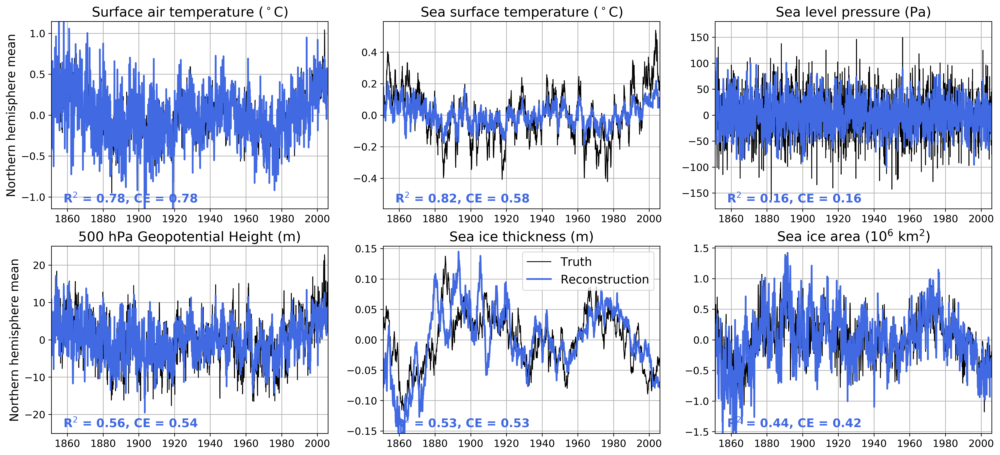

In [45]:
fig,axs = plt.subplots(2,3, figsize=(20,9))
ax = axs.flatten()

corr_allvars = {}
ce_allvars = {}

for i,var in enumerate(limvars):
    corr = np.zeros((len(Rvals)))
    ce = np.zeros((len(Rvals)))
    if 'sic' in var: 
        truth = tot_var_truth_all0_1[var]*1e-6
        recon0_01 = tot_var_forecast_all0_01[var]*1e-6
        recon0_1 = tot_var_forecast_all0_1[var]*1e-6
        recon0_4 = tot_var_forecast_all0_4[var]*1e-6
        recon0_6 = tot_var_forecast_all0_6[var]*1e-6
        recon1 = tot_var_forecast_all1[var]*1e-6
        recon2 = tot_var_forecast_all2[var]*1e-6
        recon10 = tot_var_forecast_all10[var]*1e-6
#     if 'sit' in var: 
#         truth = tot_var_truth_all_forc[var]*1e-3
#         forecast = tot_var_forecast_all_forc[var]*1e-3
    else: 
        truth = tot_var_truth_all0_1[var]
        recon0_01 = tot_var_forecast_all0_01[var]
        recon0_1 = tot_var_forecast_all0_1[var]
        recon0_4 = tot_var_forecast_all0_4[var]
        recon0_6 = tot_var_forecast_all0_6[var]
        recon1 = tot_var_forecast_all1[var]
        recon10 = tot_var_forecast_all10[var]
        recon2 = tot_var_forecast_all2[var]
    
#     corr0_01,ce0_01 = oda.calc_corr_ce(truth,recon0_01)
#     corr0_2,ce0_2 = oda.calc_corr_ce(truth,recon0_1)
#     corr0_4,ce0_4 = oda.calc_corr_ce(truth,recon0_4)
#     corr0_6,ce0_6 = oda.calc_corr_ce(truth,recon0_6)
#     corr1,ce1 = oda.calc_corr_ce(truth,recon1)
#     corr2,ce2 = oda.calc_corr_ce(truth,recon2)
#     corr10,ce10 = oda.calc_corr_ce(truth,recon10)
    
    corr[0],ce[0] = oda.calc_corr_ce(truth,recon0_01)
    corr[1],ce[1] = oda.calc_corr_ce(truth,recon0_1)
    corr[2],ce[2] = oda.calc_corr_ce(truth,recon0_4)
    corr[3],ce[3] = oda.calc_corr_ce(truth,recon0_6)
    corr[4],ce[4] = oda.calc_corr_ce(truth,recon1)
    corr[5],ce[5] = oda.calc_corr_ce(truth,recon2)
    corr[6],ce[6] = oda.calc_corr_ce(truth,recon10)
    
    ce_allvars[var] = ce
    corr_allvars[var] = corr
    
    print(var)
    print('R^2 (R=0.01) = '+str(np.round(corr[0]**2,2))+' CE = '+ str(np.round(ce[0],2)))
    print('R^2 (R=0.2) = '+str(np.round(corr[1]**2,2))+' CE = '+ str(np.round(ce[1],2)))
    print('R^2 (R=0.4) = '+str(np.round(corr[2]**2,2))+' CE = '+ str(np.round(ce[2],2)))
    print('R^2 (R=0.6) = '+str(np.round(corr[3]**2,2))+' CE = '+ str(np.round(ce[3],2)))
    print('R^2 (R=1.0) = '+str(np.round(corr[4]**2,2))+' CE = '+ str(np.round(ce[4],2)))
    print('R^2 (R=2.0) = '+str(np.round(corr[5]**2,2))+' CE = '+ str(np.round(ce[5],2)))
    print('R^2 (R=10.0) = '+str(np.round(corr[5]**2,2))+' CE = '+ str(np.round(ce[5],2)))
        
    lims = np.around(max(np.abs(truth.min()), truth.max()),decimals=2)
    lims = lims + lims/10
    
    ax[i].plot(time, truth, label='Truth',color='k', linewidth=1)
    ax[i].plot(time, recon0_01, label='Reconstruction', color='royalblue',linewidth=2)

    ax[i].text(time[80],(-lims+ lims/15),'R$^2$ = '+str(np.round(corr[2]**2,2))+', CE = '+str(np.round(ce[2],2)),
              fontsize=14, color='royalblue', fontweight='bold')

    ax[i].set_title(full_names[var], fontsize=16)
    ax[i].grid()
    ax[i].set_xlim(time[0],time[-1])
    ax[i].set_ylim(-lims,lims)
    ax[i].tick_params(axis='both', labelsize=12)

ax[4].legend(loc='upper right',fontsize=14)
ax[0].set_ylabel('Northern hemisphere mean', fontsize=14)
ax[3].set_ylabel('Northern hemisphere mean', fontsize=14)

savefolder = '/home/disk/p/mkb22/Documents/si_analysis_kb/Online_DA_monthly/eof_space/figures/'
savename = 'ODA_imperfect_pseudo_nh_means_allvars.png'

In [46]:
Rvals

[0.01, 0.2, 0.4, 0.6, 1.0, 2.0, 10.0]

Text(0.5, 0, 'Observations Uncertainty')

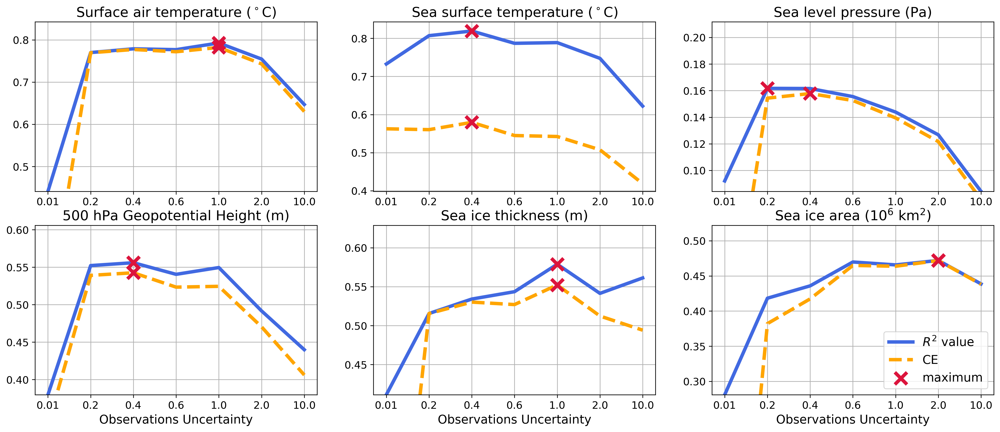

In [47]:
fig,axs = plt.subplots(2,3, figsize=(20,8))
ax = axs.flatten()

for i,var in enumerate(limvars):
    argmax_corr = np.argwhere(np.isclose(corr_allvars[var],corr_allvars[var].max()))[0][0]
    argmax_ce = np.argwhere(np.isclose(ce_allvars[var],ce_allvars[var].max()))[0][0]
    
    ax[i].plot(range(len(Rvals)), corr_allvars[var]**2, label='$R^2$ value',color='royalblue', linewidth=4)
    ax[i].plot(range(len(Rvals)), ce_allvars[var], label='CE', color='orange',linestyle='--',linewidth=4)
    ax[i].scatter(argmax_corr,corr_allvars[var][argmax_corr]**2,color='crimson',marker='x',
                  s=200,linewidth=4,zorder=5)
    ax[i].scatter(argmax_ce,ce_allvars[var][argmax_ce],color='crimson',marker='x',s=200,
                  linewidth=4, label='maximum',zorder=5)
    
    ax[i].set_title(full_names[var], fontsize=16)
    ax[i].set_xticks(range(len(Rvals)))
    ax[i].set_xticklabels([0.01, 0.2, 0.4, 0.6, 1.0, 2.0, 10.0], fontsize=14)
    ax[i].grid()
#     ax[i].set_xlim(Rvals[0],Rvals[-1])
    if 'tos' not in var:
        ax[i].set_ylim(min(corr_allvars[var]**2),max(corr_allvars[var])**2+0.05)
    ax[i].tick_params(axis='both', labelsize=12)
#    plt.setp(ax[i], xlabel="Observations Uncertainty")
#    ax[i].set_xlabel("Observations Uncertainty", fontsize=14)
    
ax[5].legend(loc='lower right',fontsize=14)
#ax[5].set_xlabel=("Observations Uncertainty")
ax[5].set_xlabel("Observations Uncertainty", fontsize=14)
ax[4].set_xlabel("Observations Uncertainty", fontsize=14)
ax[3].set_xlabel("Observations Uncertainty", fontsize=14)

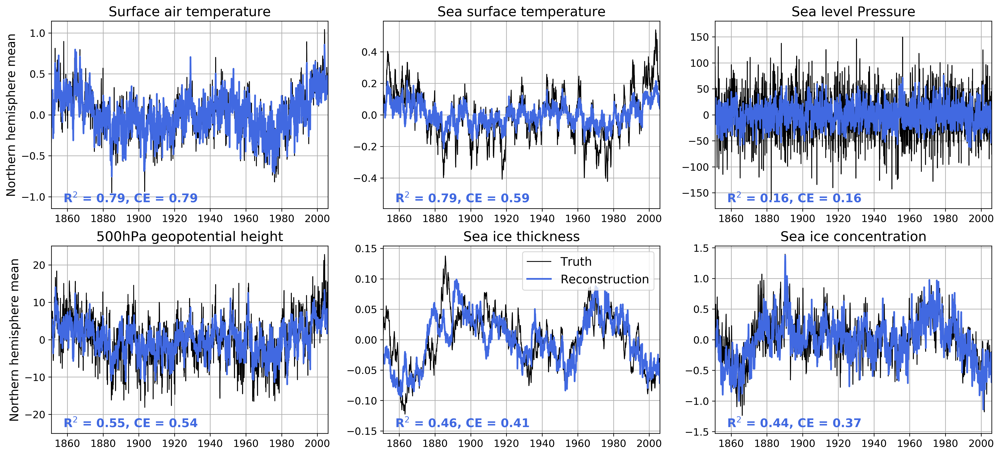

In [29]:
fig,axs = plt.subplots(2,3, figsize=(20,9))
ax = axs.flatten()

for i,var in enumerate(limvars):
    if 'sic' in var: 
        truth = tot_var_truth_all_fixed[var]*1e-6
        fixed = tot_var_forecast_all_fixed[var]*1e-6
    else: 
        truth = tot_var_truth_all_fixed[var]
        fixed = tot_var_forecast_all_fixed[var]
        
    corr,ce = oda.calc_corr_ce(truth,fixed)
        
    lims = np.around(max(np.abs(truth.min()), truth.max()),decimals=2)
    lims = lims + lims/10
    
    ax[i].plot(time, truth, label='Truth',color='k', linewidth=1)
    ax[i].plot(time, fixed, label='Reconstruction', color='royalblue',linewidth=2)

    ax[i].text(time[80],(-lims+ lims/15),'R$^2$ = '+str(np.round(corr**2,2))+', CE = '+str(np.round(ce,2)),
              fontsize=14, color='royalblue', fontweight='bold')

    ax[i].set_title(full_names[var], fontsize=16)
    ax[i].grid()
    ax[i].set_xlim(time[0],time[-1])
    ax[i].set_ylim(-lims,lims)
    ax[i].tick_params(axis='both', labelsize=12)

ax[4].legend(loc='upper right',fontsize=14)
ax[0].set_ylabel('Northern hemisphere mean', fontsize=14)
ax[3].set_ylabel('Northern hemisphere mean', fontsize=14)

savefolder = '/home/disk/p/mkb22/Documents/si_analysis_kb/Online_DA_monthly/eof_space/figures/'
savename = 'ODA_imperfect_pseudo_nh_means_allvars.png'

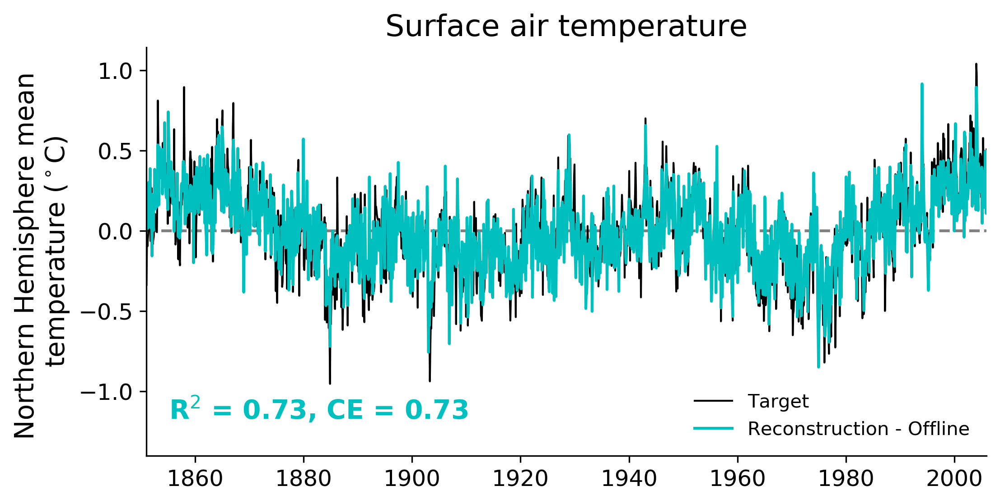

In [85]:
fig,ax = plt.subplots(1,1, figsize=(8,4))

plt.axhline(0, linestyle='--', color='gray')

truth = tot_var_truth_all_forc['tas']
forecast = tot_var_forecast_all_forc['tas']
fixed = tot_var_forecast_all_fixed['tas']
offline = tot_var_forecast_all_offline['tas']

corr,ce = oda.calc_corr_ce(truth,forecast)
corr_fix,ce_fix = oda.calc_corr_ce(truth,fixed)
corr_off,ce_off = oda.calc_corr_ce(truth,offline)

lims = np.around(max(np.abs(truth.min()), truth.max()),decimals=2)
lims = lims + lims/10

ax.plot(time, truth, label='Target',color='k', linewidth=1)
#ax.plot(time, fixed, label='Reconstruction - fixed covariance', color='c',linewidth=1.5)
ax.plot(time, offline, label='Reconstruction - Offline', color='c',linewidth=1.5)
# ax.plot(time, forecast, label='Reconstruction - Online', color='royalblue',linewidth=2)

# ax.text(time[50],(-1.42+ lims/15),'R$^2$ = '+str(np.round(corr**2,2))+', CE = '+str(np.round(ce,2)),
#           fontsize=14, color='royalblue', fontweight='bold')
# ax.text(time[50],(-1.4+ 3*lims/15),'R$^2$ = '+str(np.round(corr_fix**2,2))+', CE = '+str(np.round(ce_fix,2)),
#           fontsize=14, color='c', fontweight='bold')
ax.text(time[50],(-1.4+ 3*lims/15),'R$^2$ = '+str(np.round(corr_off**2,2))+', CE = '+str(np.round(ce_off,2)),
          fontsize=14, color='c', fontweight='bold')

plt.ylabel('Northern Hemisphere mean \ntemperature ($^\circ$C)',fontsize=14)
ax.set_title('Surface air temperature', fontsize=16)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.legend(loc='lower right', frameon=False)

#ax.grid()
ax.set_xlim(time[0],time[-1])
ax.set_ylim(-lims,lims)
ax.set_ylim(-1.4,lims)
ax.tick_params(axis='both', labelsize=12)

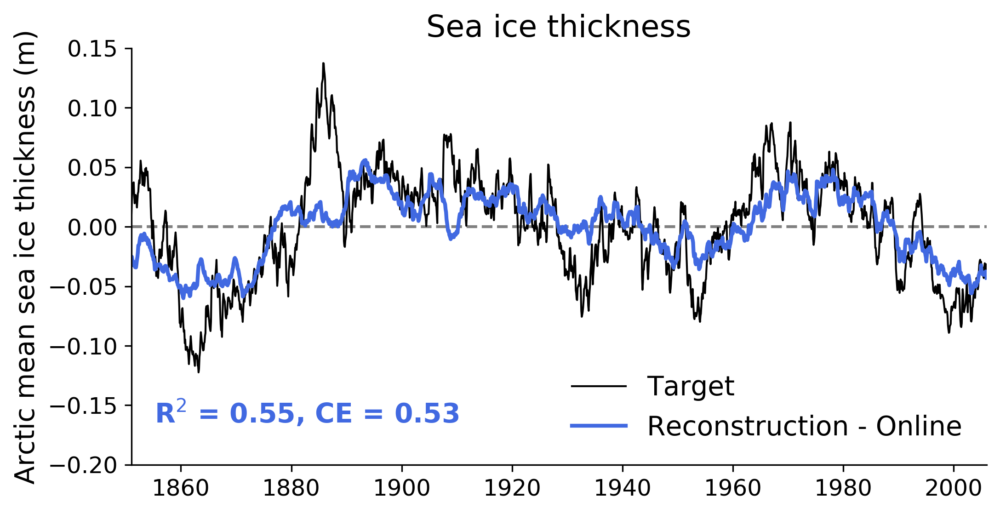

In [90]:
fig,ax = plt.subplots(1,1, figsize=(8,4))

plt.axhline(0, linestyle='--', color='gray')

truth = tot_var_truth_all_forc['sit']
forecast = tot_var_forecast_all_forc['sit']
fixed = tot_var_forecast_all_fixed['sit']
offline = tot_var_forecast_all_offline['sit']

corr,ce = oda.calc_corr_ce(truth,forecast)
corr_fix,ce_fix = oda.calc_corr_ce(truth,fixed)
corr_off,ce_off = oda.calc_corr_ce(truth,offline)

lims = np.around(max(np.abs(truth.min()), truth.max()),decimals=2)
lims = lims + lims/10

ax.plot(time, truth, label='Target',color='k', linewidth=1)
#ax.plot(time, fixed, label='Reconstruction - fixed covariance', color='c',linewidth=1.5)
#ax.plot(time, offline, label='Reconstruction - Offline', color='c',linewidth=1.5)
ax.plot(time, forecast, label='Reconstruction - Online', color='royalblue',linewidth=2)

ax.text(time[50],(-0.165),'R$^2$ = '+str(np.round(corr**2,2))+', CE = '+str(np.round(ce,2)),
          fontsize=14, color='royalblue', fontweight='bold')
# ax.text(time[50],(-1.4+ 3*lims/15),'R$^2$ = '+str(np.round(corr_fix**2,2))+', CE = '+str(np.round(ce_fix,2)),
#           fontsize=14, color='c', fontweight='bold')
# ax.text(time[50],(-0.19),'R$^2$ = '+str(np.round(corr_off**2,2))+', CE = '+str(np.round(ce_off,2)),
#           fontsize=14, color='c', fontweight='bold')

plt.ylabel('Arctic mean sea ice thickness (m)',fontsize=14)
ax.set_title('Sea ice thickness', fontsize=16)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.legend(loc='lower right', frameon=False, fontsize=14)

#ax.grid()
ax.set_xlim(time[0],time[-1])
ax.set_ylim(-0.2,0.15)
ax.tick_params(axis='both', labelsize=12)

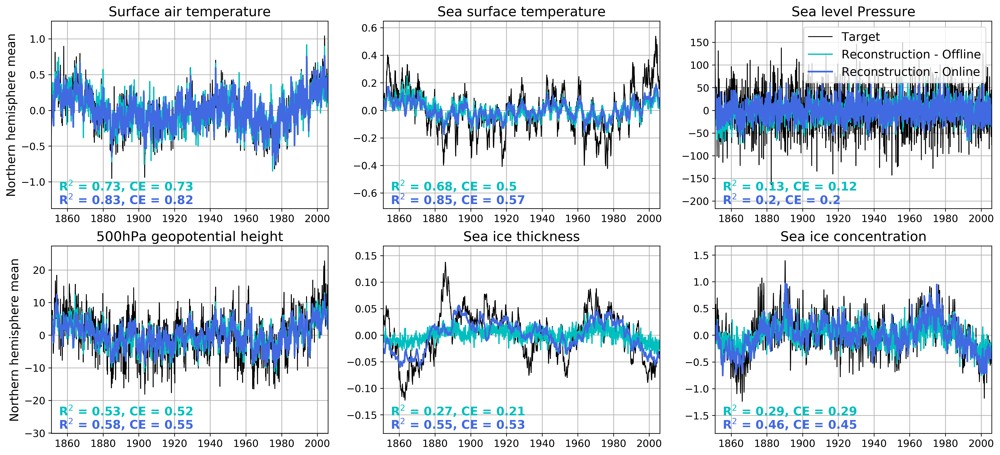

In [88]:
fig,axs = plt.subplots(2,3, figsize=(20,9))
ax = axs.flatten()

for i,var in enumerate(limvars):
    if 'sic' in var:    
        truth = tot_var_truth_all_forc[var]*1e-6
        forecast = tot_var_forecast_all_forc[var]*1e-6
        fixed = tot_var_forecast_all_fixed[var]*1e-6
        offline = tot_var_forecast_all_offline[var]*1e-6
    else: 
        truth = tot_var_truth_all_forc[var]
        forecast = tot_var_forecast_all_forc[var]
        fixed = tot_var_forecast_all_fixed[var]
        offline = tot_var_forecast_all_offline[var]

    corr,ce = oda.calc_corr_ce(truth,forecast)
    corr_fix,ce_fix = oda.calc_corr_ce(truth,fixed)
    corr_off,ce_off = oda.calc_corr_ce(truth,offline)

    lims = np.around(max(np.abs(truth.min()), truth.max()),decimals=2)
    lims = lims + 2*lims/10

    ax[i].plot(time, truth, label='Target',color='k', linewidth=1)
    #ax.plot(time, fixed, label='Reconstruction - fixed covariance', color='c',linewidth=1.5)
    ax[i].plot(time, offline, label='Reconstruction - Offline', color='c',linewidth=1.5)
    ax[i].plot(time, forecast, label='Reconstruction - Online', color='royalblue',linewidth=2)
        

    ax[i].text(time[50],(-lims-0.5*lims/10),'R$^2$ = '+str(np.round(corr**2,2))+', CE = '+str(np.round(ce,2)),
          fontsize=14, color='royalblue', fontweight='bold')
    # ax.text(time[50],(-1.4+ 3*lims/15),'R$^2$ = '+str(np.round(corr_fix**2,2))+', CE = '+str(np.round(ce_fix,2)),
    #           fontsize=14, color='c', fontweight='bold')
    ax[i].text(time[50],(-lims+lims/10),'R$^2$ = '+str(np.round(corr_off**2,2))+', CE = '+str(np.round(ce_off,2)),
              fontsize=14, color='c', fontweight='bold')

    ax[i].set_title(full_names[var], fontsize=16)
    ax[i].grid()
    ax[i].set_xlim(time[0],time[-1])
    ax[i].set_ylim(-lims-lims/10,lims)
    ax[i].tick_params(axis='both', labelsize=12)

ax[2].legend(loc='upper right',fontsize=14)
ax[0].set_ylabel('Northern hemisphere mean', fontsize=14)
ax[3].set_ylabel('Northern hemisphere mean', fontsize=14)

savefolder = '/home/disk/p/mkb22/Documents/si_analysis_kb/Online_DA_monthly/eof_space/figures/'
savename = 'ODA_imperfect_pseudo_nh_means_allvars.png'

## Full field: Spatial skill: 

In [85]:
full_names = {'tas':'Surface air temperature', 
              'tos':'Sea surface temperature',
              'psl':'Sea level pressure',
              'zg': 'Geopotential Height (500hPa)',
              'sit': 'Sea ice thickness',
              'sic': 'Sea ice concentration'}

In [183]:
LIMd['var_dict']['sic']['lat'][15], LIMd['var_dict']['sic']['lon'][-6]

(69.15789473684211, 345.0)

In [206]:
var = 'sic'
Xa_dcomp_all_ensmn = np.nanmean(Xa_dcomp_all[var],axis=0)

Xa_dcomp_all_ensmn_3d = np.reshape(Xa_dcomp_all_ensmn,(LIMd['var_dict'][var]['lat'].shape[0],LIMd['var_dict'][var]['lon'].shape[0],X_var_all[var].shape[1]))
X_var_true_sic_3d = np.reshape(X_var_all[var],(LIMd['var_dict'][var]['lat'].shape[0],LIMd['var_dict'][var]['lon'].shape[0],X_var_all[var].shape[1]))
X_var_train_sic_3d = np.reshape(X_var_all_cesm_lme[var],(LIMd['var_dict'][var]['lat'].shape[0],LIMd['var_dict'][var]['lon'].shape[0],X_var_all_cesm_lme['sic'].shape[1]))

In [208]:
np.var(Xa_dcomp_all_ensmn_3d[18,-2,:]), np.var(X_var_true_sic_3d[18,-2,:])

(0.015912031810302884, 0.01613979508020157)

In [209]:
np.mean(Xa_dcomp_all_ensmn_3d[18,-2,:]), np.mean(X_var_true_sic_3d[18,-2,:])

(0.0014682331937573994, -1.17196625880647e-10)

Text(0.5, 1.0, 'Central Arctic grid cell: SIC')

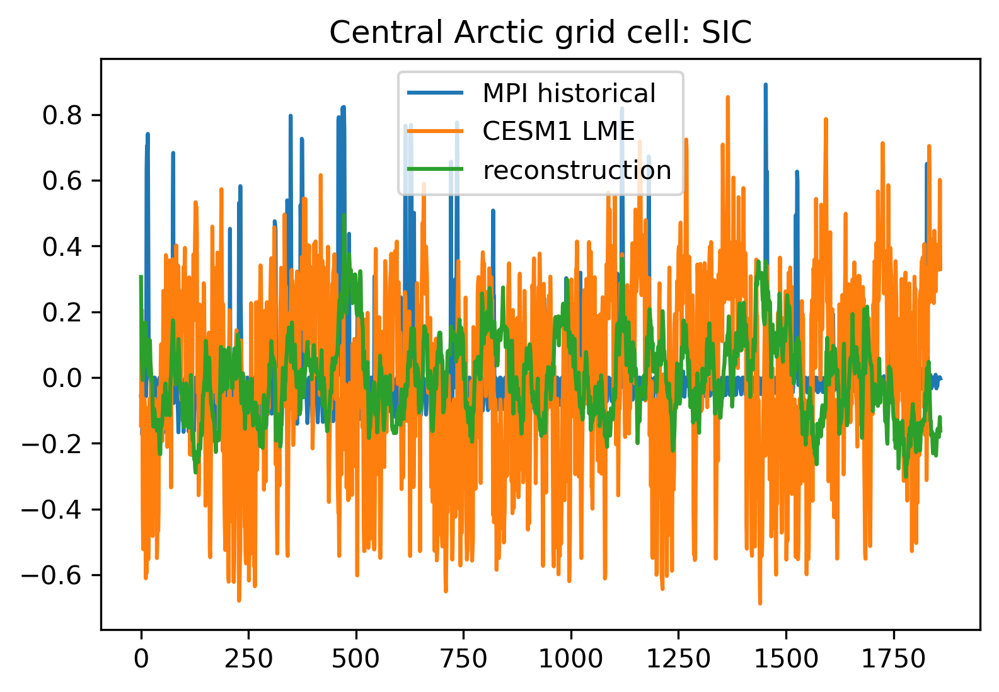

In [207]:
plt.plot(X_var_true_sic_3d[18,-2,:], label='MPI historical')
plt.plot(X_var_train_sic_3d[18,-2,0:1860], label='CESM1 LME')
plt.plot(Xa_dcomp_all_ensmn_3d[18,-2,:], label='reconstruction')

plt.legend()
plt.title('Central Arctic grid cell: SIC')

In [89]:
LIMd['var_dict'][var]['lat'][24]

46.42105263157893

In [170]:
corr_all = {}
ce_all = {}

for var in limvars: 
    Xa_dcomp_all_ensmn = np.nanmean(Xa_dcomp_all[var],axis=0)
    
    corr_var = np.zeros((Xa_dcomp_all_ensmn.shape[0]))
    ce_var = np.zeros((Xa_dcomp_all_ensmn.shape[0]))

    for i in range(Xa_dcomp_all_ensmn.shape[0]):
        corr_var[i] = np.corrcoef(X_var_all[var][i,:],Xa_dcomp_all_ensmn[i,:])[0,1]
        ce_var[i] = oda.coefficient_efficiency(X_var_all[var][i,:],Xa_dcomp_all_ensmn[i,:])

    corr_var_2d = np.reshape(corr_var,(LIMd['var_dict'][var]['lat'].shape[0],LIMd['var_dict'][var]['lon'].shape[0]))
    ce_var_2d = np.reshape(ce_var,(LIMd['var_dict'][var]['lat'].shape[0],LIMd['var_dict'][var]['lon'].shape[0]))
    
    corr_all[var] = corr_var_2d
    ce_all[var] = ce_var_2d

../../Online_DA_utils.py:100: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)
../../Online_DA_utils.py:101: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
../../Online_DA_utils.py:101: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)


In [171]:
X_var_all[var].shape, Xa_dcomp_all_ensmn.shape, Xa_dcomp_all_ensmn.shape[0]

((3888, 1860), (3888, 1860), 3888)

In [172]:
from cartopy.util import add_cyclic_point
import matplotlib
import matplotlib.colors as colors

cmap = matplotlib.cm.get_cmap('RdBu_r')

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
               'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

new_cmap = truncate_colormap(cmap, minval=0.5, maxval=1.0, n=100)

/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:30: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/IPython/core/events.py:88: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  func(*args, **kwargs)


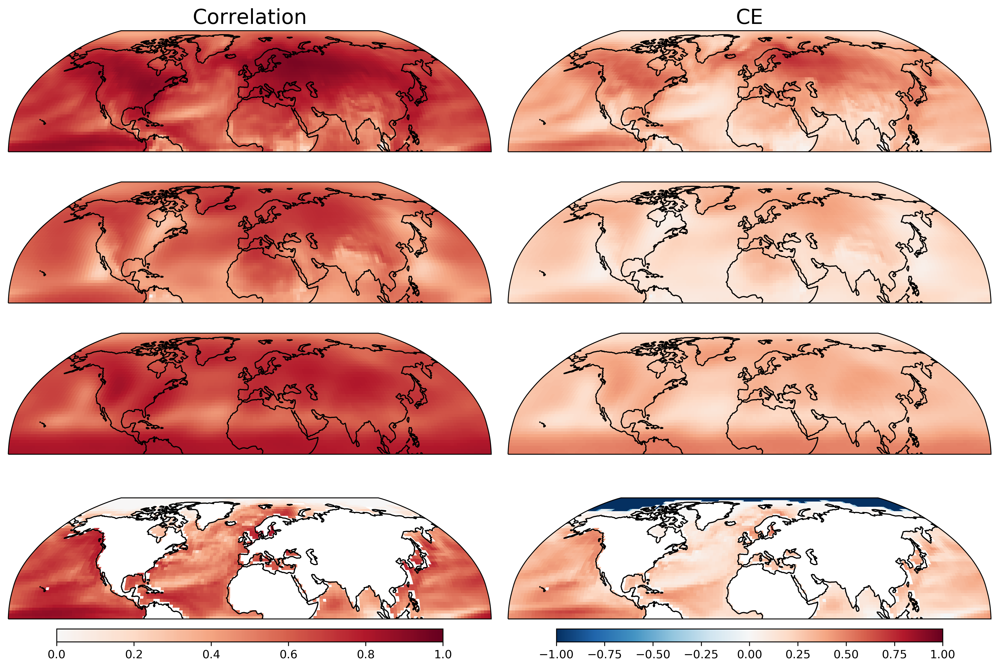

In [173]:
#fig = plt.figure(2, figsize=(14, 18))
fig,axs = plt.subplots(4,2, figsize=(12, 8), constrained_layout=True,
                       subplot_kw={'projection':ccrs.Robinson()})
ax = axs.flatten()
pltv = np.arange(0,8,2)

for v,var in enumerate(['tas','psl','zg','tos']): 
    lat = LIMd['var_dict'][var]['lat']
    lon = LIMd['var_dict'][var]['lon']
    
    wrap_corr, wrap_lon = add_cyclic_point(corr_all[var], coord=lon)
    wrap_ce, wrap_lon = add_cyclic_point(ce_all[var], coord=lon)
    
    i = pltv[v]
    ax[i].coastlines()
    cb1 = ax[i].pcolormesh(wrap_lon,lat,wrap_corr,#corr_all[var],
                           cmap=new_cmap,transform=ccrs.PlateCarree(),
                           vmin=0, vmax=1)

    ax[i+1].coastlines()
    cb2 = ax[i+1].pcolormesh(wrap_lon,lat,wrap_ce,
                   cmap='RdBu_r',transform=ccrs.PlateCarree(),vmin=-1, vmax=1)

ax[0].set_title('Correlation', fontsize=18)
ax[1].set_title('CE', fontsize=18)

plt.colorbar(cb1, orientation='horizontal', shrink=0.8, ax=ax[6])
plt.colorbar(cb2, orientation='horizontal', shrink=0.8, ax=ax[7])

plt.tight_layout()

In [174]:
full_names = {'tas':'Surface air temperature', 
              'tos':'Sea surface temperature',
              'psl':'Sea level pressure',
              'zg': '500 hPa Geopotential Height',
              'sit': 'Sea ice thickness',
              'sic': 'Sea ice concentration'}

In [154]:
LIMd['var_dict']['tos']['lon']

array([  0. ,   2.5,   5. ,   7.5,  10. ,  12.5,  15. ,  17.5,  20. ,
        22.5,  25. ,  27.5,  30. ,  32.5,  35. ,  37.5,  40. ,  42.5,
        45. ,  47.5,  50. ,  52.5,  55. ,  57.5,  60. ,  62.5,  65. ,
        67.5,  70. ,  72.5,  75. ,  77.5,  80. ,  82.5,  85. ,  87.5,
        90. ,  92.5,  95. ,  97.5, 100. , 102.5, 105. , 107.5, 110. ,
       112.5, 115. , 117.5, 120. , 122.5, 125. , 127.5, 130. , 132.5,
       135. , 137.5, 140. , 142.5, 145. , 147.5, 150. , 152.5, 155. ,
       157.5, 160. , 162.5, 165. , 167.5, 170. , 172.5, 175. , 177.5,
       180. , 182.5, 185. , 187.5, 190. , 192.5, 195. , 197.5, 200. ,
       202.5, 205. , 207.5, 210. , 212.5, 215. , 217.5, 220. , 222.5,
       225. , 227.5, 230. , 232.5, 235. , 237.5, 240. , 242.5, 245. ,
       247.5, 250. , 252.5, 255. , 257.5, 260. , 262.5, 265. , 267.5,
       270. , 272.5, 275. , 277.5, 280. , 282.5, 285. , 287.5, 290. ,
       292.5, 295. , 297.5, 300. , 302.5, 305. , 307.5, 310. , 312.5,
       315. , 317.5,

/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:58: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/IPython/core/events.py:88: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  func(*args, **kwargs)


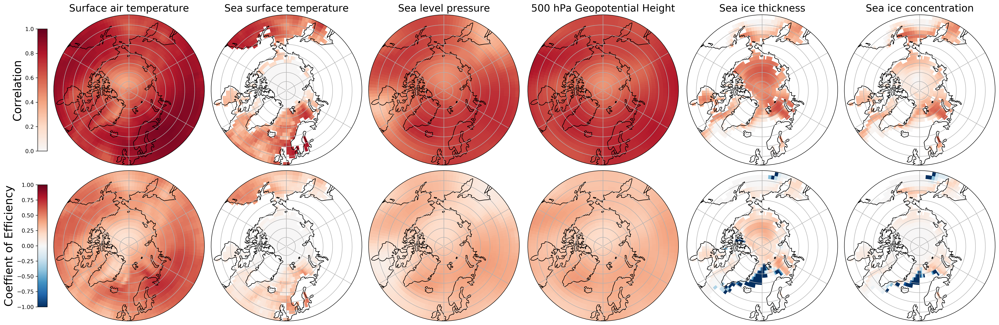

In [179]:
#fig = plt.figure(2, figsize=(14, 18))
fig,axs = plt.subplots(2,6, figsize=(25,8),constrained_layout=True,
                       subplot_kw={'projection':ccrs.NorthPolarStereo()})
ax = axs.flatten()
pltv = np.arange(6,12,1)

for v,var in enumerate(limvars):
    lat = LIMd['var_dict'][var]['lat']
    lon = LIMd['var_dict'][var]['lon']
    
    if 'tos' in var: 
        corr_hold = np.where(ce_all['tos']<=0.01,0.0,corr_all['tos'])
        ce_hold = np.where(ce_all['tos']<=0.01,0.0,ce_all['tos'])
    else: 
        corr_hold = corr_all[var]
        ce_hold = ce_all[var]
    
    wrap_corr, wrap_lon = add_cyclic_point(corr_hold, coord=lon)
    wrap_ce, wrap_lon = add_cyclic_point(ce_hold, coord=lon)
    
    ax[v].coastlines()
    ax[v].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[v].set_boundary(circle, transform=ax[v].transAxes)
    ax[v].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb1 = ax[v].pcolormesh(wrap_lon,lat,wrap_corr,
                           cmap=new_cmap,transform=ccrs.PlateCarree(),
                           vmin=0, vmax=1)
    i = pltv[v]
    ax[i].coastlines()
    ax[i].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[i].set_boundary(circle, transform=ax[i].transAxes)
    ax[i].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb2 = ax[i].pcolormesh(wrap_lon,lat,wrap_ce,
                           cmap='RdBu_r',transform=ccrs.PlateCarree(),
                           vmin=-1, vmax=1)
    
    ax[v].set_title(full_names[var], fontsize=18)


colb1 = fig.colorbar(cb1, location='left',shrink=0.8, ax=ax[0],aspect=40)
colb2 = plt.colorbar(cb2, location='left',shrink=0.8, ax=ax[6],aspect=40)

colb1.set_label(label='Correlation', size=20)
colb2.set_label(label='Coeffient of Efficiency', size=20)

plt.tight_layout()

savename = 'ODA_imperfect_pseudo_spatial_performance_allvars.png'

#plt.savefig(savefolder+savename)

/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/disk/chaos/mkb22/anaconda2/envs/lims_update/lib/python3.6/site-packages/IPython/core/events.py:88: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  func(*args, **kwargs)


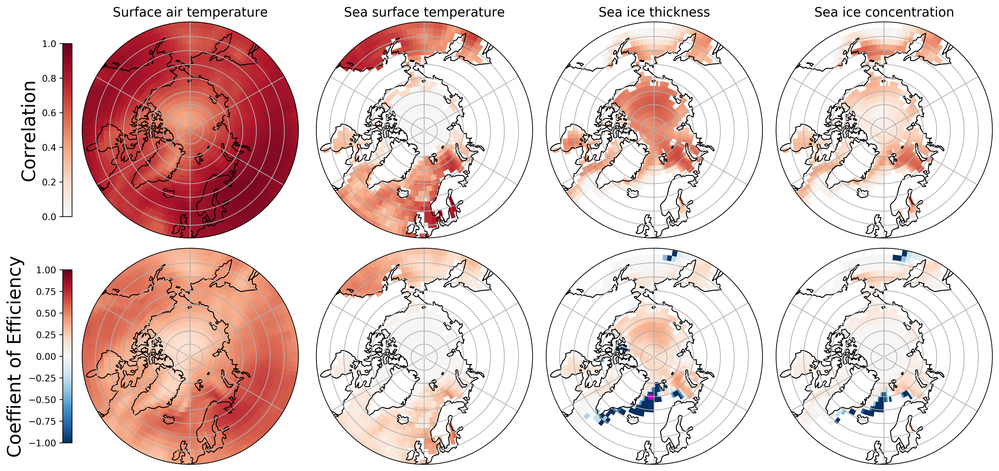

In [204]:
#fig = plt.figure(2, figsize=(14, 18))
fig,axs = plt.subplots(2,4, figsize=(15,7), constrained_layout=True,
                       subplot_kw={'projection':ccrs.NorthPolarStereo()})
ax = axs.flatten()
pltv = np.arange(4,8,1)

for v,var in enumerate(['tas','tos','sit','sic']):
    lat = LIMd['var_dict'][var]['lat']
    lon = LIMd['var_dict'][var]['lon']
    
    if 'tos' in var: 
        corr_hold = np.where(ce_all['tos']<=0.01,0.0,corr_all['tos'])
        ce_hold = np.where(ce_all['tos']<=0.01,0.0,ce_all['tos'])
    else: 
        corr_hold = corr_all[var]
        ce_hold = ce_all[var]
    
    wrap_corr, wrap_lon = add_cyclic_point(corr_hold, coord=lon)
    wrap_ce, wrap_lon = add_cyclic_point(ce_hold, coord=lon)
    
    ax[v].coastlines()
    ax[v].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[v].set_boundary(circle, transform=ax[v].transAxes)
    ax[v].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb1 = ax[v].pcolormesh(wrap_lon,lat,wrap_corr,
                           cmap=new_cmap,transform=ccrs.PlateCarree(),
                           vmin=0, vmax=1)
    i = pltv[v]
    ax[i].coastlines()
    ax[i].gridlines()
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax[i].set_boundary(circle, transform=ax[i].transAxes)
    ax[i].set_extent([-180, 180, 90, 50], crs=ccrs.PlateCarree())
    cb2 = ax[i].pcolormesh(wrap_lon,lat,wrap_ce,
                           cmap='RdBu_r',transform=ccrs.PlateCarree(),
                           vmin=-1, vmax=1)
    
    ax[v].set_title(full_names[var], fontsize=14)


ax[6].scatter([lon[-2]],[lat[18]], color='m',transform=ccrs.PlateCarree())
ax[0].set_ylabel('Correlation', fontsize=16)
# ax[1].set_title('CE', fontsize=18)

colb1 = fig.colorbar(cb1, location='left',shrink=0.8, ax=ax[0],aspect=40)
colb2 = plt.colorbar(cb2, location='left',shrink=0.8, ax=ax[4],aspect=40)

colb1.set_label(label='Correlation', size=20)
colb2.set_label(label='Coeffient of Efficiency', size=20)
plt.tight_layout()

savename = 'ODA_imperfect_pseudo_spatial_performance_4vars.png'

#plt.savefig(savefolder+savename)

In [198]:
wrap_lon[-6], lat[15]

(347.5, 69.15789473684211)